In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
#load the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

### 1. importing data

In [3]:
data = pd.read_csv(r"D:\ExcelR P189\temperature_data.csv")
data.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [4]:
data

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72


#### 2.1 getting data ready

In [5]:
# data.shape               #it tells about no. of records and features
# data.columns             #determines column names
# data.dtypes              #checking data types
# data.isna().sum()        #checking --- is there any null value or not

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         998070 non-null  float64
 1   coolant         998070 non-null  float64
 2   u_d             998070 non-null  float64
 3   u_q             998070 non-null  float64
 4   motor_speed     998070 non-null  float64
 5   torque          998070 non-null  float64
 6   i_d             998070 non-null  float64
 7   i_q             998070 non-null  float64
 8   pm              998070 non-null  float64
 9   stator_yoke     998070 non-null  float64
 10  stator_tooth    998070 non-null  float64
 11  stator_winding  998070 non-null  float64
 12  profile_id      998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


In [7]:
#data doesn't contain any missing value
#no object type or categorical type data found

In [8]:
data[data.duplicated()].shape       #checking no. of duplicate records

(0, 13)

In [9]:
data.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.003905,0.004723,0.004780,-0.005690,-0.006336,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,0.993127,1.002423,0.997878,1.002330,1.001229,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.371529,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.599385,-1.037925,-0.826359,-0.927390,-0.951892,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,0.266157,-0.177187,0.267542,-0.099818,-0.140246,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.686675,0.650709,0.358491,0.852625,0.853584,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


#### 2.2 distribution plot

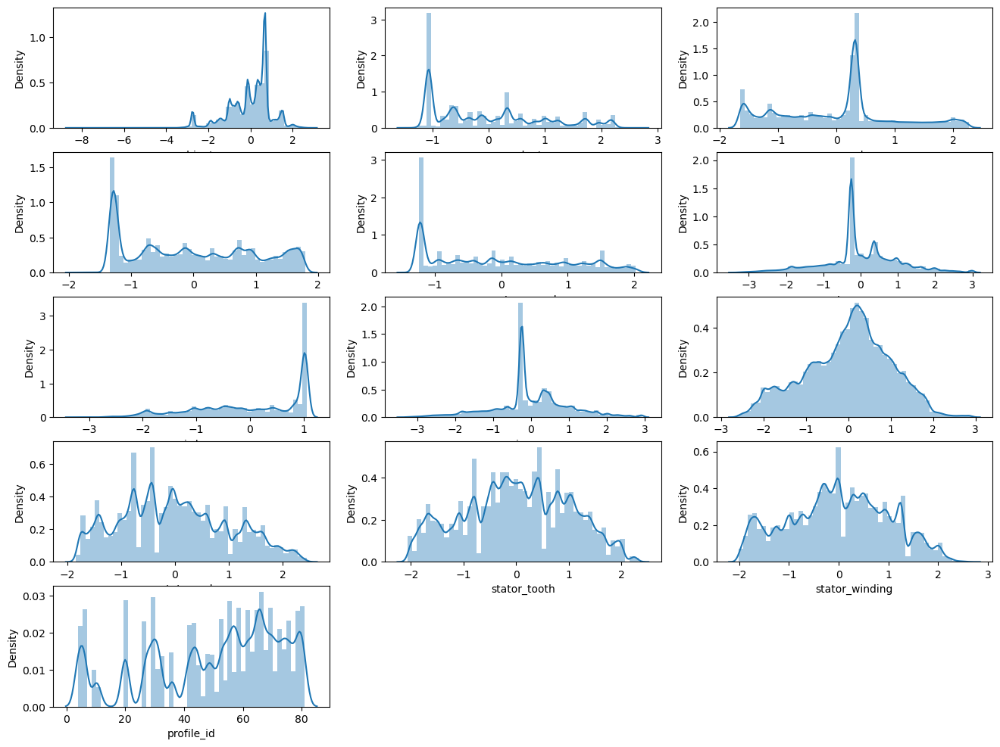

In [10]:
import seaborn as sns
plt.figure(figsize=(16,12))

for i in range(len(data.columns)):
    plt.subplot(5,3, i + 1)
    sns.distplot(data[data.columns[i]])
    
plt.show() 

#for perfectly skewed N.D. kurtosis = 3

#### 2.3 detecting outliers

#### a)isolation forest method

In [11]:
data1=data.drop(['profile_id'],axis = 1)

In [12]:
from sklearn.ensemble import IsolationForest

model = IsolationForest(random_state=10,contamination=.01)
model.fit(data1)

y_pred_outliers = model.predict(data1)
y_pred_outliers                            #-1 for outliers and 1 for inliers.


array([1, 1, 1, ..., 1, 1, 1])

In [13]:
data1['scores']=model.decision_function(data1)
data1['anomaly']=model.predict(data1.iloc[:,0:12])

data1[data1['anomaly']==-1]                                     #Print the outlier data points

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,scores,anomaly
64910,0.323332,-1.053206,2.249414,-1.786895,0.130299,-2.795790,-3.142842,-2.397124,0.098285,-0.383763,0.461529,1.471063,-0.003284,-1
64911,0.323616,-1.057179,2.250789,-1.777089,0.130299,-2.795517,-3.130717,-2.398035,0.100271,-0.372999,0.461622,1.479323,-0.003284,-1
64912,0.326680,-1.060651,2.250753,-1.779064,0.130296,-2.796057,-3.133041,-2.397790,0.102394,-0.365119,0.462326,1.484139,-0.003284,-1
64913,0.327997,-1.064424,2.250268,-1.783364,0.130300,-2.796114,-3.137907,-2.397413,0.103905,-0.350353,0.469825,1.489693,-0.003284,-1
64914,0.324050,-1.068011,2.249416,-1.790678,0.130297,-2.796336,-3.146127,-2.396826,0.105496,-0.329148,0.490122,1.495605,-0.003284,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
954946,-0.432382,1.799518,2.187780,-0.384775,-0.133982,-2.729604,-0.800303,-2.724081,1.037225,2.033164,1.879853,1.792242,-0.012195,-1
954947,-0.442841,1.721175,2.153606,-0.325308,-0.142590,-2.661652,-0.677763,-2.677019,0.955441,2.035654,1.881610,1.799982,-0.010445,-1
954948,-0.406241,1.630343,2.081810,-0.279179,-0.165141,-2.569803,-0.551871,-2.603517,0.918788,2.037155,1.890770,1.806563,-0.003599,-1
954949,-0.356186,1.528359,2.023234,-0.217803,-0.174817,-2.469640,-0.428632,-2.519564,0.932100,2.038509,1.897702,1.810669,-0.002143,-1


#### b)boxplot

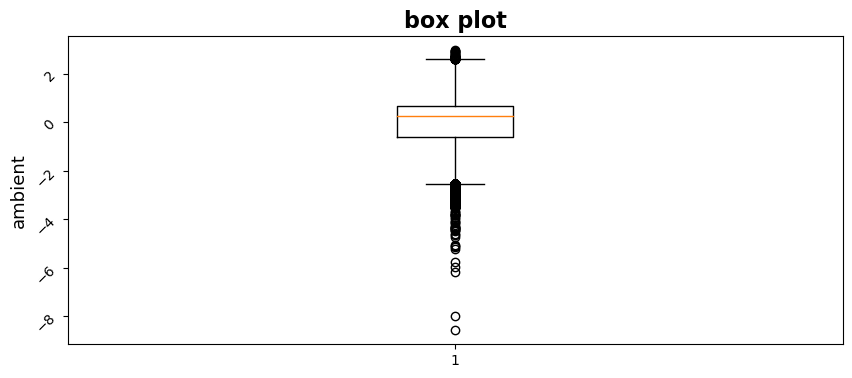

[array([-0.59938534, -2.5284324 ]), array([0.68667525, 2.6156435 ])]

In [14]:
plt.figure(figsize=(10,4))                                                   #setting the frame using figure size
#figsize = plt.figaspect(9/6)                                                #setting the frame using aspect ratio
plt.title("box plot", fontsize = 16, fontweight = "bold")                    #title
plt.ylabel("ambient", fontsize = 13 )                                        #y-label
plt.yticks( rotation = 45, fontsize = 10)                                    #y-values rotation and font size


box=plt.boxplot(x='ambient', data=data)                            #Outliers                                     
#box=plt.boxplot(x='coolant', data=data)                                 #no outliers
#box=plt.boxplot(x='u_d', data=data)                                #outliers 
#box=plt.boxplot(x='u_q', data=data)                                     #no outliers
#box=plt.boxplot(x='motor_speed', data=data)                             #no outliers
#box=plt.boxplot(x='torque', data=data)                             #outliers
#box=plt.boxplot(x='i_d', data=data)                                     #no outliers
#box=plt.boxplot(x='i_q', data=data)                                #outliers
#box=plt.boxplot(x='pm', data=data)                                 #outliers
#box=plt.boxplot(x='stator_yoke', data=data)                             #no outliers                        
#box=plt.boxplot(x='stator_tooth', data=data)                            #no outliers
#box=plt.boxplot(x='stator_winding', data=data)                          #no outliers


plt.show() 


[item.get_ydata() for item in box['whiskers']]                      #to show whisker limit

In [15]:
#replacing outliers with percentiles


p_10 = np.percentile(data['ambient'], 10)
p_90 = np.percentile(data['ambient'], 90)
data.loc[data.ambient < -0.5938534, 'ambient'] = np.nan
data.fillna(p_10,inplace=True)
data.loc[data.ambient >2.6156435 , 'ambient'] = np.nan
data.fillna(p_90,inplace=True)


p_90 = np.percentile(data['u_d'], 90)
data.loc[data.u_d >2.135748  , 'u_d'] = np.nan
data.fillna(p_90,inplace=True)


p_10 = np.percentile(data['torque'], 10)
p_90 = np.percentile(data['torque'], 90)
data.loc[data.torque <-0.26691731, 'torque'] = np.nan
data.fillna(p_10,inplace=True)
data.loc[data.torque >1.7682999, 'torque'] = np.nan
data.fillna(p_90,inplace=True)


p_10 = np.percentile(data['i_q'], 10)
p_90 = np.percentile(data['i_q'], 90)
data.loc[data.i_q <-0.25726893, 'i_q'] = np.nan
data.fillna(p_10,inplace=True)
data.loc[data.i_q >1.633992 , 'i_q'] = np.nan
data.fillna(p_90,inplace=True)

p_90 = np.percentile(data['pm'], 90)
data.loc[data.pm >2.7100978  , 'pm'] = np.nan
data.fillna(p_90,inplace=True)

In [16]:
# #replacing outliers with median   #we have to repeat this step bcoz there are still outliers in our data


# p_10 = np.percentile(data['ambient'], 50)
# p_90 = np.percentile(data['ambient'], 50)
# data.loc[data.ambient < -0.5938534, 'ambient'] = np.nan
# data.fillna(p_10,inplace=True)
# data.loc[data.ambient >2.6156435 , 'ambient'] = np.nan
# data.fillna(p_90,inplace=True)


# p_90 = np.percentile(data['u_d'], 50)
# data.loc[data.u_d >2.135748  , 'u_d'] = np.nan
# data.fillna(p_90,inplace=True)


# p_10 = np.percentile(data['torque'], 50)
# p_90 = np.percentile(data['torque'], 50)
# data.loc[data.torque <-0.26691731, 'torque'] = np.nan
# data.fillna(p_10,inplace=True)
# data.loc[data.torque >1.7682999, 'torque'] = np.nan
# data.fillna(p_90,inplace=True)


# p_10 = np.percentile(data['i_q'], 50)
# p_90 = np.percentile(data['i_q'], 50)
# data.loc[data.i_q <-0.25726893, 'i_q'] = np.nan
# data.fillna(p_10,inplace=True)
# data.loc[data.i_q >1.633992 , 'i_q'] = np.nan
# data.fillna(p_90,inplace=True)

# p_90 = np.percentile(data['pm'], 50)
# data.loc[data.pm >2.7100978  , 'pm'] = np.nan
# data.fillna(p_90,inplace=True)

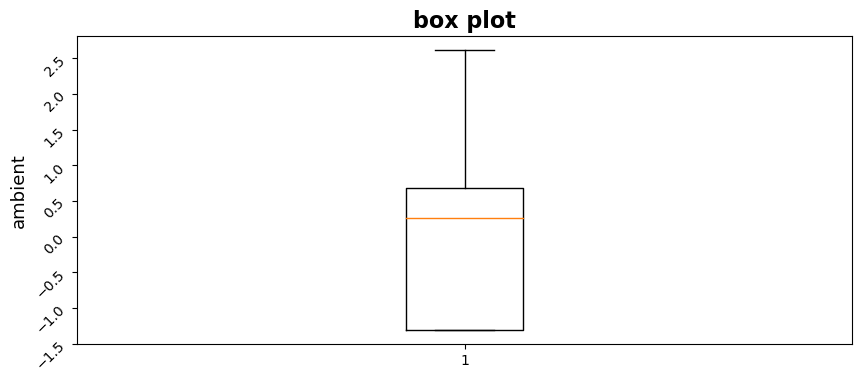

[array([-1.30969029, -1.30969029]), array([0.68667525, 2.6156435 ])]

In [17]:
#boxplot after removing/replacing outliers


plt.figure(figsize=(10,4))                                                   #setting the frame using figure size
#figsize = plt.figaspect(9/6)                                                #setting the frame using aspect ratio
plt.title("box plot", fontsize = 16, fontweight = "bold")                    #title
plt.ylabel("ambient", fontsize = 13 )                                        #y-label
plt.yticks( rotation = 45, fontsize = 10)                                    #y-values rotation and font size


box=plt.boxplot(x='ambient', data=data)                            #Outliers                                     
#box=plt.boxplot(x='coolant', data=data)                                 #no outliers
#box=plt.boxplot(x='u_d', data=data)                                #outliers 
#box=plt.boxplot(x='u_q', data=data)                                     #no outliers
#box=plt.boxplot(x='motor_speed', data=data)                             #no outliers
#box=plt.boxplot(x='torque', data=data)                             #outliers
#box=plt.boxplot(x='i_d', data=data)                                     #no outliers
#box=plt.boxplot(x='i_q', data=data)                                #outliers
#box=plt.boxplot(x='pm', data=data)                                 #outliers
#box=plt.boxplot(x='stator_yoke', data=data)                             #no outliers                        
#box=plt.boxplot(x='stator_tooth', data=data)                            #no outliers
#box=plt.boxplot(x='stator_winding', data=data)                          #no outliers


plt.show() 


[item.get_ydata() for item in box['whiskers']]                      #to show whisker limit

In [18]:
#we find that there are no more outliers in our original dataset

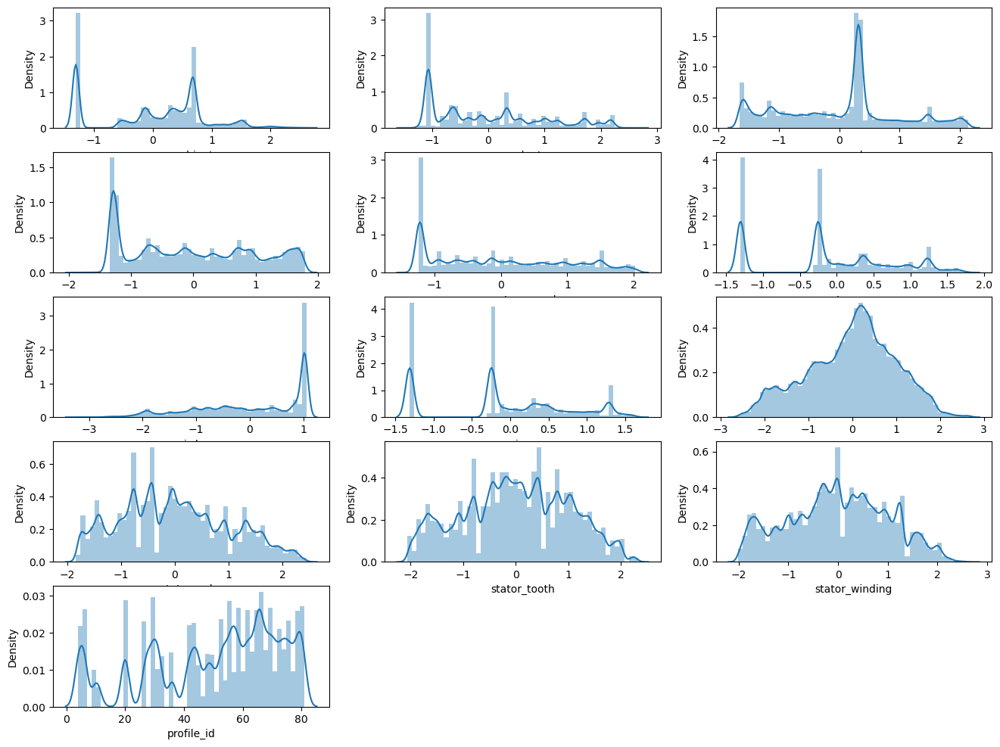

In [19]:
#distribution plot after removing outliers

plt.figure(figsize=(16,12))
for i in range(len(data.columns)):
    plt.subplot(5,3, i + 1)
    sns.distplot(data[data.columns[i]])
plt.show() 

### 3. Visualisation

<AxesSubplot:xlabel='motor_speed', ylabel='ambient'>

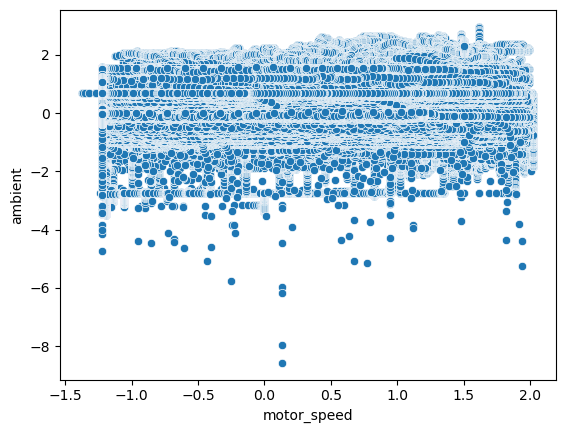

In [10]:
sns.scatterplot(data=data,x='motor_speed',y='ambient')

<AxesSubplot:xlabel='motor_speed', ylabel='coolant'>

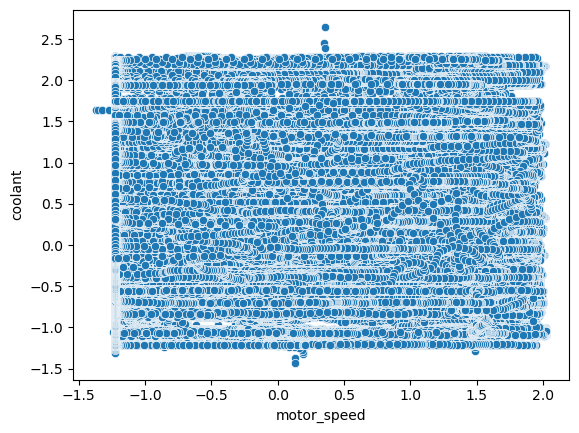

In [14]:
sns.scatterplot(data=data,x='motor_speed',y='coolant')

Text(0, 0.5, 'Stator winding temperature')

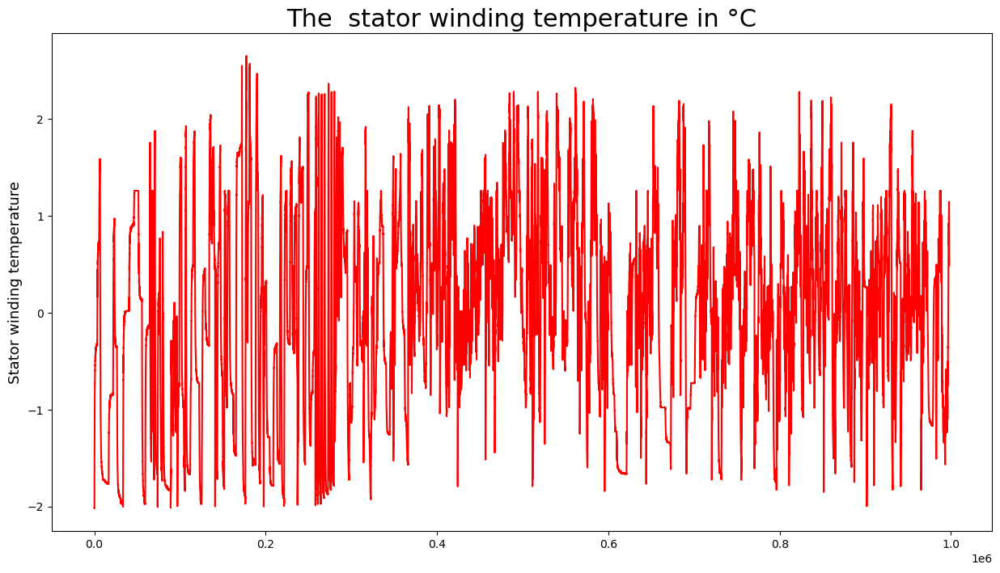

In [15]:
# Plot the winding temperature
plt.figure(figsize = (15, 8))

plt.plot(data['stator_winding'], 'r')

plt.title('The  stator winding temperature in °C', fontsize = 22)
plt.ylabel('Stator winding temperature', fontsize = 13)

Text(0, 0.5, 'Stator Yoke temperature')

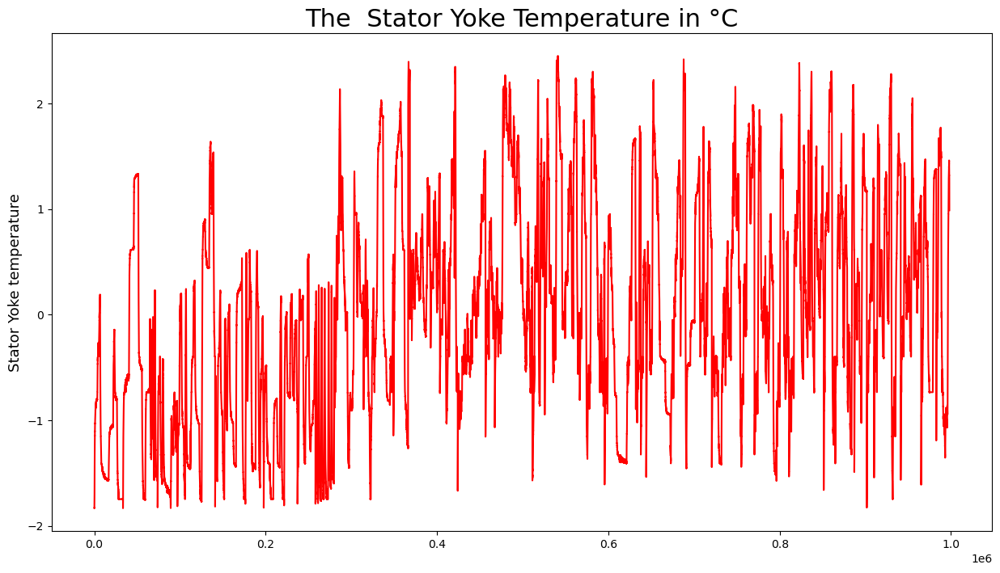

In [16]:
# Plot the stator yoke temperature
plt.figure(figsize = (15, 8))

plt.plot(data['stator_yoke'], 'r')

plt.title('The  Stator Yoke Temperature in °C', fontsize = 22)
plt.ylabel('Stator Yoke temperature', fontsize = 13)

Text(0, 0.5, 'Stator Tooth temperature')

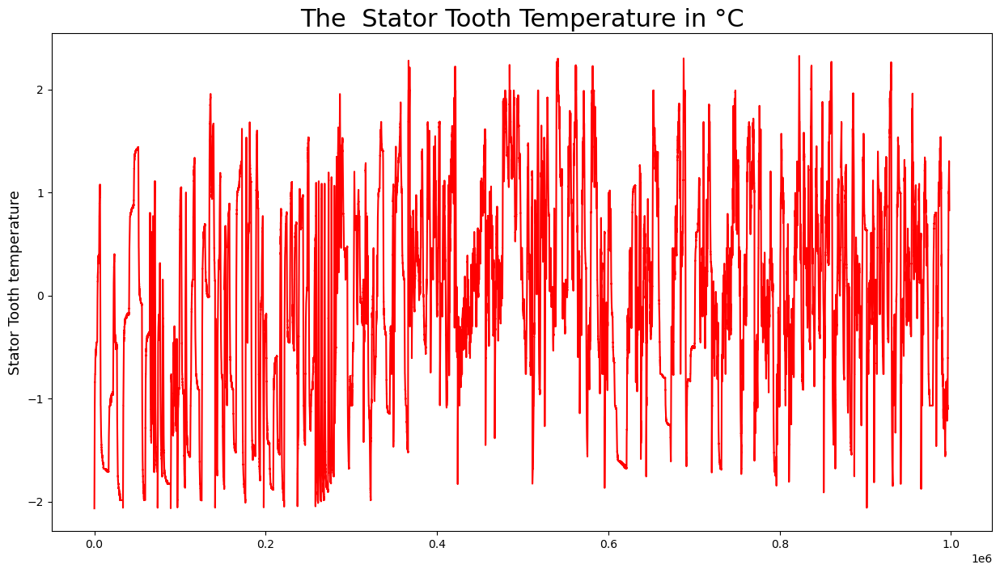

In [17]:
# Plot the stator tooth temperature
plt.figure(figsize = (15, 8))

plt.plot(data['stator_tooth'], 'r')

plt.title('The  Stator Tooth Temperature in °C', fontsize = 22)
plt.ylabel('Stator Tooth temperature', fontsize = 13)


<AxesSubplot:>

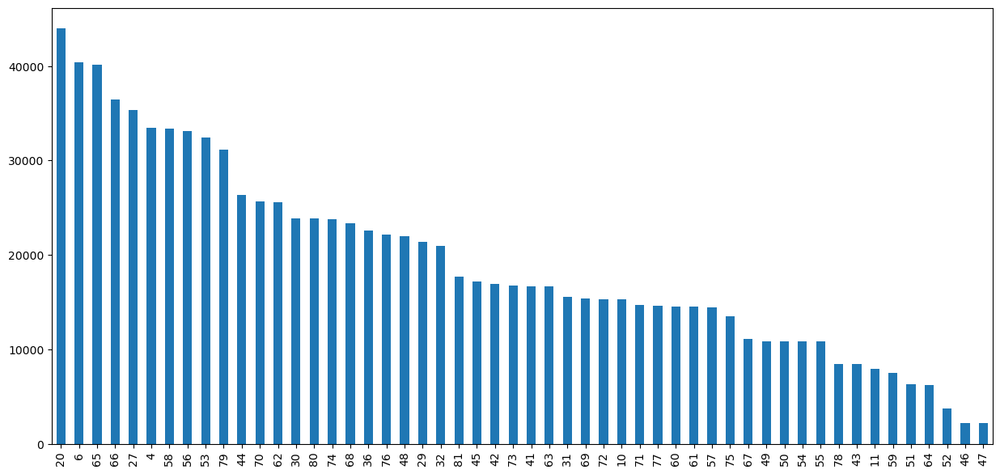

In [18]:
plt.subplots(figsize=(15,7))
data['profile_id'].value_counts().plot(kind = 'bar')

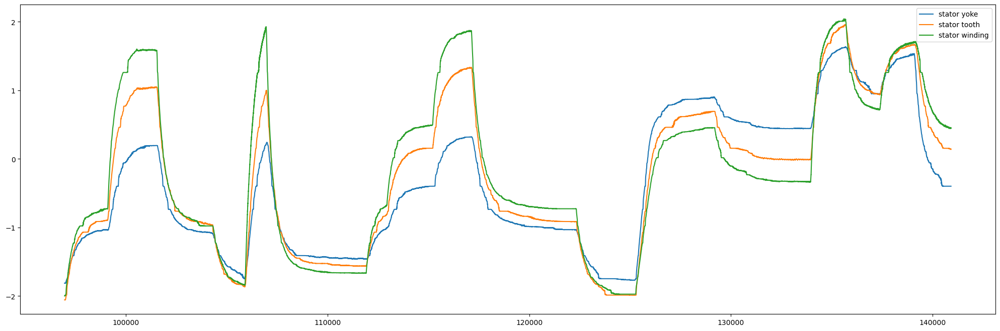

In [19]:
plt.figure(figsize=(25,8))
data[data['profile_id'] == 20]['stator_yoke'].plot(label = 'stator yoke')
data[data['profile_id'] == 20]['stator_tooth'].plot(label = 'stator tooth')
data[data['profile_id'] == 20]['stator_winding'].plot(label = 'stator winding')
plt.legend()

### 4. checking linearity

#### a)pairplot 

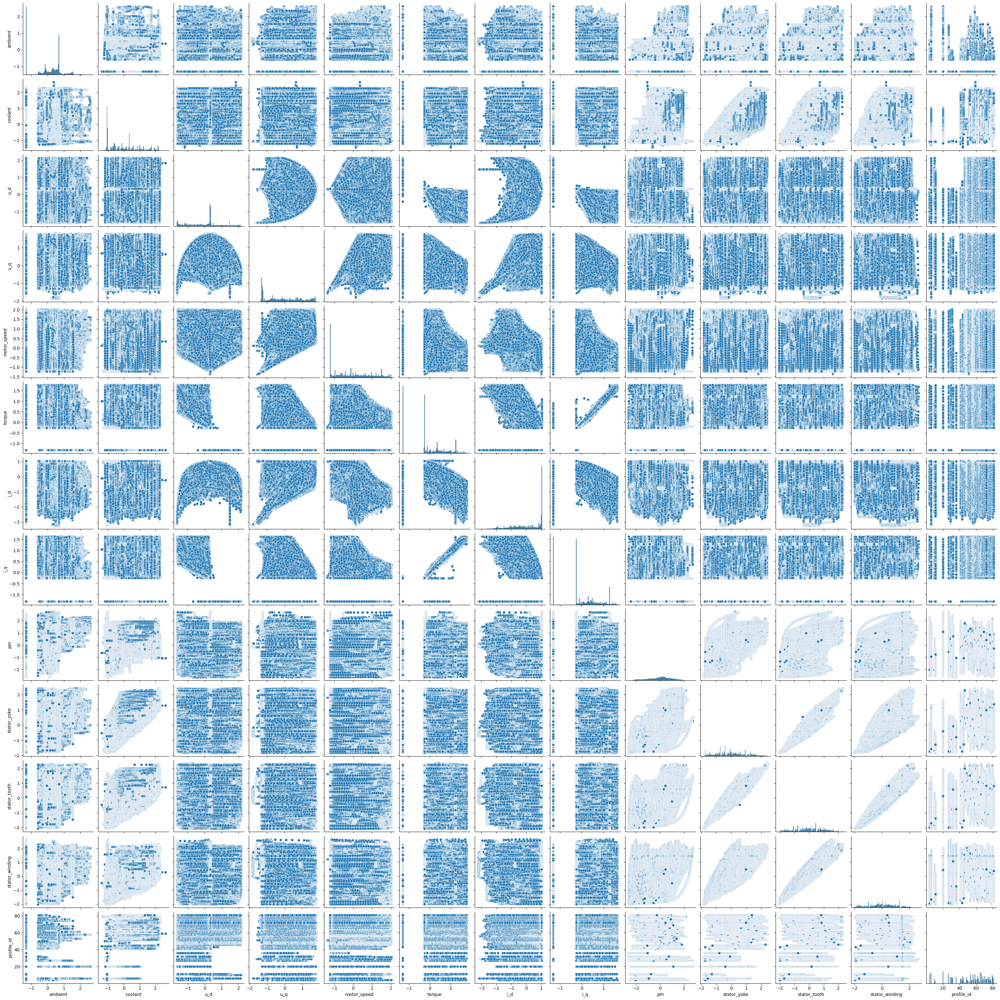

In [20]:
sns.pairplot(data)

#### b)heatmap

<AxesSubplot:>

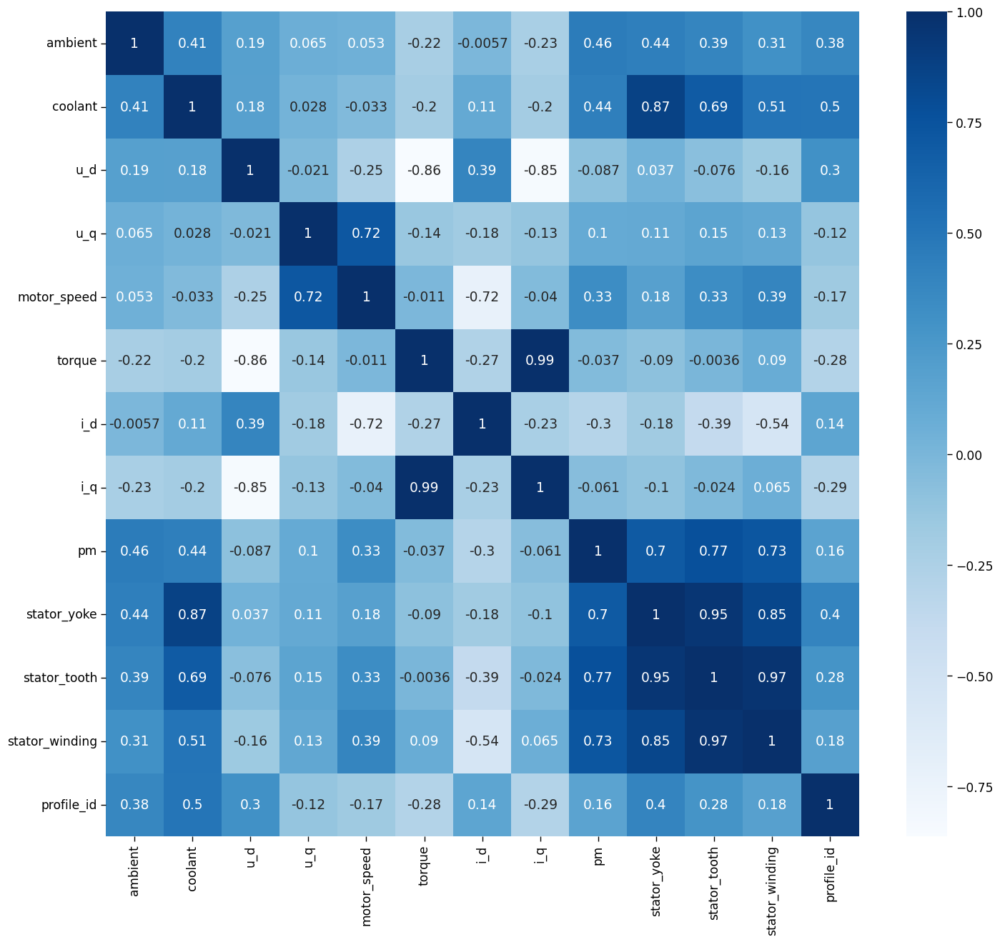

In [21]:
plt.figure(figsize=(17,15))
sns.set_context('paper', font_scale=1.4)
correlation = data.corr()

sns.heatmap(correlation, 
            annot=True, 
            cmap='Blues'
           )

### 5. correlation analysis

In [22]:
data.corr()                     #there should be good correlation between x and y
                                #and there should be no or less correlation between x and x

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
ambient,1.000000,0.412429,0.189916,0.065317,0.052600,-0.221898,-0.005664,-0.226656,0.457509,0.439168,0.390645,0.308337,0.375419
coolant,0.412429,1.000000,0.180759,0.027851,-0.033332,-0.198221,0.108489,-0.199365,0.435162,0.874037,0.689003,0.509298,0.499669
u_d,0.189916,0.180759,1.000000,-0.021033,-0.246760,-0.863630,0.388517,-0.845355,-0.087157,0.036859,-0.075612,-0.163868,0.303332
u_q,0.065317,0.027851,-0.021033,1.000000,0.716897,-0.136435,-0.181855,-0.126758,0.103609,0.106186,0.149017,0.125445,-0.122260
motor_speed,0.052600,-0.033332,-0.246760,0.716897,1.000000,-0.010949,-0.722914,-0.040362,0.330265,0.182564,0.333909,0.393154,-0.166225
torque,-0.221898,-0.198221,-0.863630,-0.136435,-0.010949,1.000000,-0.272814,0.994201,-0.037369,-0.090145,-0.003636,0.089803,-0.282247
i_d,-0.005664,0.108489,0.388517,-0.181855,-0.722914,-0.272814,1.000000,-0.228518,-0.296139,-0.179903,-0.387712,-0.539924,0.142368
i_q,-0.226656,-0.199365,-0.845355,-0.126758,-0.040362,0.994201,-0.228518,1.000000,-0.060703,-0.102648,-0.023950,0.064701,-0.285386
pm,0.457509,0.435162,-0.087157,0.103609,0.330265,-0.037369,-0.296139,-0.060703,1.000000,0.697691,0.769014,0.728825,0.160065
stator_yoke,0.439168,0.874037,0.036859,0.106186,0.182564,-0.090145,-0.179903,-0.102648,0.697691,1.000000,0.949898,0.845144,0.398021


In [23]:
#here motor_speed is our target 
#magnitude gives strength of the relation
#strength of relation between motor_speed and u_q, i_d is good while with pm, stator_tooth, stator winding is poor and 
#with rest of the features is not well or very very poor

#there is very good relation between coolant and stator_yoke (87%)
#                                    u_d and torque, i_q (86% and 84%)
#                                    torque and i_q (99%)
#                                    stator_yoke and stator_tooth, stator_winding (94% and 84%)
#                                    stator_tooth and stator_winding (96%)

### 6. model building trial 01

In [24]:
import statsmodels.formula.api as sms
model = sms.ols('motor_speed~ambient+coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit()           
print(model.summary())

#we get good value for R-squared
#
#null hypothesis : beta_1 (coeff. of x's) = 0
#alternate hypothesis : beta_1 != 0
#p-low  null-go , hence null hypothesis rejected and alternate hypothesis accepted it means there is a relation between x and y
#but if null hypothesis is accepted it means coeff. of that x's feature has no effect while predicting y 

                            OLS Regression Results                            
Dep. Variable:            motor_speed   R-squared:                       0.936
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                 1.327e+06
Date:                Mon, 30 Jan 2023   Prob (F-statistic):               0.00
Time:                        19:10:41   Log-Likelihood:                -45736.
No. Observations:              998070   AIC:                         9.150e+04
Df Residuals:                  998058   BIC:                         9.164e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.0253      0.000    -97.

### 7. dealing with problematic columns

#### a) dealing with x-values which have good correlation

In [25]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~u_d",data=data).fit() 
m2 = sms.ols("motor_speed~torque",data=data).fit()
m3 = sms.ols("motor_speed~u_d+torque",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% u_d predict 6.08% and torque predict 0.01%
#and together predict 25.8% 
#also they have significant p-values

0.060890733523784935 Intercept    3.140124e-18
u_d          0.000000e+00
dtype: float64
0.00011988805025686666 Intercept    5.027705e-13
torque       7.495406e-28
dtype: float64
0.2584276227925998 Intercept    0.0
u_d          0.0
torque       0.0
dtype: float64


In [26]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~u_d",data=data).fit() 
m2 = sms.ols("motor_speed~i_q",data=data).fit()
m3 = sms.ols("motor_speed~u_d+i_q",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% u_d predict 6.08% and i_q predict 0.1%
#and together predict 27.8% 
#also they have significant p-values

0.060890733523784935 Intercept    3.140124e-18
u_d          0.000000e+00
dtype: float64
0.0016291235240027957 Intercept    1.720104e-22
i_q          0.000000e+00
dtype: float64
0.2780869691157436 Intercept    0.0
u_d          0.0
i_q          0.0
dtype: float64


In [27]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~i_q",data=data).fit() 
m2 = sms.ols("motor_speed~torque",data=data).fit()
m3 = sms.ols("motor_speed~i_q+torque",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% i_q predict 0.16% and torque predict 0.01%
#and together predict 7.5% 
#also they have significant p-values

0.0016291235240027957 Intercept    1.720104e-22
i_q          0.000000e+00
dtype: float64
0.00011988805025686666 Intercept    5.027705e-13
torque       7.495406e-28
dtype: float64
0.07524738505663009 Intercept    1.858967e-30
i_q          0.000000e+00
torque       0.000000e+00
dtype: float64


In [28]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~stator_yoke",data=data).fit() 
m2 = sms.ols("motor_speed~coolant",data=data).fit()
m3 = sms.ols("motor_speed~stator_yoke+coolant",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% stator_yoke predict 3.3% and coolant predict 0.1%
#and together predict 19.09% 
#also they have significant p-values

0.03332945505351226 Intercept      6.050663e-11
stator_yoke    0.000000e+00
dtype: float64
0.0011109903460608805 Intercept     6.914196e-10
coolant      2.903123e-243
dtype: float64
0.19095867794310295 Intercept      0.000784
stator_yoke    0.000000
coolant        0.000000
dtype: float64


In [29]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~stator_yoke",data=data).fit() 
m2 = sms.ols("motor_speed~stator_tooth",data=data).fit()
m3 = sms.ols("motor_speed~stator_yoke+stator_tooth",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% stator_yoke predict 3.3% and mkts stator_tooth 11.1%
#and together predict 29.6% 
#also they have significant p-values

0.03332945505351226 Intercept      6.050663e-11
stator_yoke    0.000000e+00
dtype: float64
0.111495495138619 Intercept       3.126033e-09
stator_tooth    0.000000e+00
dtype: float64
0.296987639922596 Intercept       0.026609
stator_yoke     0.000000
stator_tooth    0.000000
dtype: float64


In [30]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~stator_yoke",data=data).fit() 
m2 = sms.ols("motor_speed~stator_winding",data=data).fit()
m3 = sms.ols("motor_speed~stator_yoke+stator_winding",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% stator_yoke predict 3.3% and stator_winding predict 15.4%
#and together predict 23.3% 
#also they have significant p-values

0.03332945505351226 Intercept      6.050663e-11
stator_yoke    0.000000e+00
dtype: float64
0.15457020579391745 Intercept         2.085260e-07
stator_winding    0.000000e+00
dtype: float64
0.23300979289746493 Intercept         0.001962
stator_yoke       0.000000
stator_winding    0.000000
dtype: float64


In [31]:
import statsmodels.formula.api as sms
m1 = sms.ols("motor_speed~stator_tooth",data=data).fit() 
m2 = sms.ols("motor_speed~stator_winding",data=data).fit()
m3 = sms.ols("motor_speed~stator_tooth+stator_winding",data=data).fit()
print(m1.rsquared,m1.pvalues)
print(m2.rsquared,m2.pvalues)
print(m3.rsquared,m3.pvalues)   

#out of 100% stator_tooth predict 11.1% and stator_winding predict 15.4%
#and together predict 18.5% 
#also they have significant p-values

0.111495495138619 Intercept       3.126033e-09
stator_tooth    0.000000e+00
dtype: float64
0.15457020579391745 Intercept         2.085260e-07
stator_winding    0.000000e+00
dtype: float64
0.1855315473571284 Intercept         0.000043
stator_tooth      0.000000
stator_winding    0.000000
dtype: float64


In [32]:
#there is very good relation between coolant and stator_yoke (87%)
#                                    u_d and torque, i_q (86% and 84%)
#                                    torque and i_q (99%)
#                                    stator_yoke and stator_tooth, stator_winding (94% and 84%)
#                                    stator_tooth and stator_winding (96%)

#out of 100% u_d predict 6.08% and torque predict 0.01%
#and together predict 25.8% 
#also they have significant p-values

#out of 100% u_d predict 6.08% and i_q predict 0.1%
#and together predict 27.8% 
#also they have significant p-values

#out of 100% i_q predict 0.16% and torque predict 0.01%
#and together predict 7.5% 
#also they have significant p-values

#out of 100% stator_yoke predict 3.3% and coolant predict 0.1%
#and together predict 19.09% 
#also they have significant p-values


#out of 100% stator_yoke predict 3.3% and mkts stator_tooth 11.1%
#and together predict 29.6% 
#also they have significant p-values

#out of 100% stator_yoke predict 3.3% and stator_winding predict 15.4%
#and together predict 23.3% 
#also they have significant p-values

#out of 100% stator_tooth predict 11.1% and stator_winding predict 15.4%
#and together predict 18.5% 
#also they have significant p-values

#### b) multicollinearity (VIF)

In [33]:
#For vif we only talk about x-values
#high vif implies high Rsquared implies high correlation 
#and here we talk about x-value, so we need less correlation between them and hence need less vif
import statsmodels.formula.api as smf

rsq_ambient=smf.ols('ambient~coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_ambient=1/(1-rsq_ambient)

rsq_coolant=smf.ols('coolant~ambient+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_coolant=1/(1-rsq_coolant)

rsq_u_d=smf.ols('u_d~ambient+coolant+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_u_d=1/(1-rsq_u_d)

rsq_u_q=smf.ols('u_q~ambient+coolant+u_d+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_u_q=1/(1-rsq_u_q)

rsq_torque=smf.ols('torque~ambient+coolant+u_d+u_q+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_torque=1/(1-rsq_torque)

rsq_i_d=smf.ols('i_d~ambient+coolant+u_d+u_q+torque+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_i_d=1/(1-rsq_i_d)

rsq_i_q=smf.ols('i_q~ambient+coolant+u_d+u_q+torque+i_d+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_i_q=1/(1-rsq_i_q)

rsq_pm=smf.ols('pm~ambient+coolant+u_d+u_q+torque+i_d+i_q+stator_yoke+stator_tooth+stator_winding',data=data).fit().rsquared
vif_pm=1/(1-rsq_pm)

rsq_yoke=smf.ols('stator_yoke~ambient+coolant+u_d+u_q+torque+i_d+i_q+pm+stator_tooth+stator_winding',data=data).fit().rsquared
vif_yoke=1/(1-rsq_yoke)

rsq_tooth=smf.ols('stator_tooth~ambient+coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_winding',data=data).fit().rsquared
vif_tooth=1/(1-rsq_tooth)

rsq_winding=smf.ols('stator_winding~ambient+coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth',data=data).fit().rsquared
vif_winding=1/(1-rsq_winding)

# storing VIF in a DataFrame
d1={'Variables':['ambient','coolant','u_d','u_q','torque','i_d','i_q','pm','s_yoke','s_tooth','s_winding'],
    'Vif':[vif_ambient,vif_coolant,vif_u_d,vif_u_q,vif_torque,vif_i_d,vif_i_q,vif_pm,vif_yoke,vif_tooth,vif_winding]}
Vif_df=pd.DataFrame(d1)
Vif_df


,Variables,Vif
0,ambient,1.446716
1,coolant,39.768568
2,u_d,5.221767
3,u_q,1.529436
4,torque,127.719495
5,i_d,3.171645
6,i_q,114.744066
7,pm,4.037099
8,s_yoke,368.953294
9,s_tooth,622.952871


#### C) error / residue handling

#### c-1) test for normality of residuals (Q-Q Plot)

In [34]:
model.resid

0         0.216799
1         0.214940
2         0.217145
3         0.216812
4         0.215724
            ...   
998065    0.169204
998066    0.174376
998067    0.160729
998068    0.163674
998069    0.144851
Length: 998070, dtype: float64

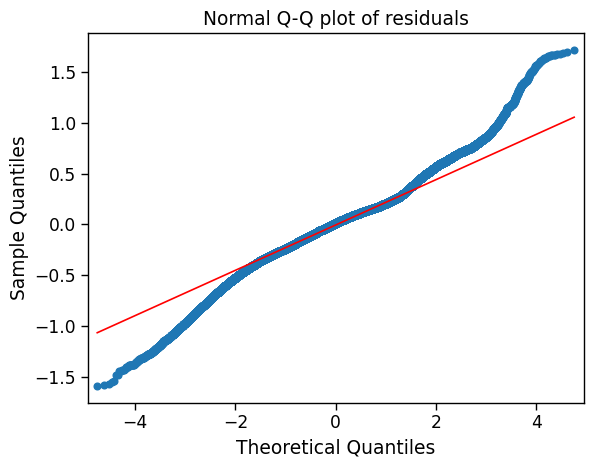

In [35]:
import statsmodels.api as sm
qqplot=sm.qqplot(model.resid,line='q') 
plt.title("Normal Q-Q plot of residuals")
plt.show()

In [36]:
#there should be no pattern in the errors (errors should be random/normally distributed)
#how to identify that errors have no pattren : if Q-Q plot is a straight line then it follows normal distribution

#### c-2) Residual Plot for Homoscedasticity

In [37]:
def get_standardized_values( vals ):
    return (vals - vals.mean())/vals.std()

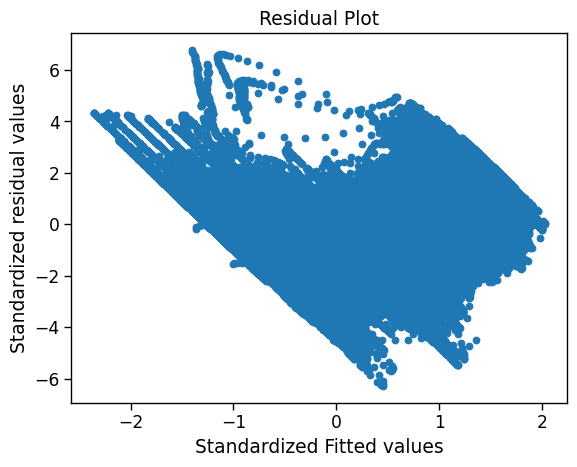

In [38]:
plt.scatter(get_standardized_values(model.fittedvalues),
            get_standardized_values(model.resid))

plt.title('Residual Plot')
plt.xlabel('Standardized Fitted values')
plt.ylabel('Standardized residual values')
plt.show()

In [39]:
#checking variance of error :
#we get most of the error lies between -6 and 6 and it is a good thing

#there should be constant variance in error
#we expect some error to be +ve and some to be -ve and of equal magnitude as well

#### c-3) Residual Vs Regressors

eval_env: 1


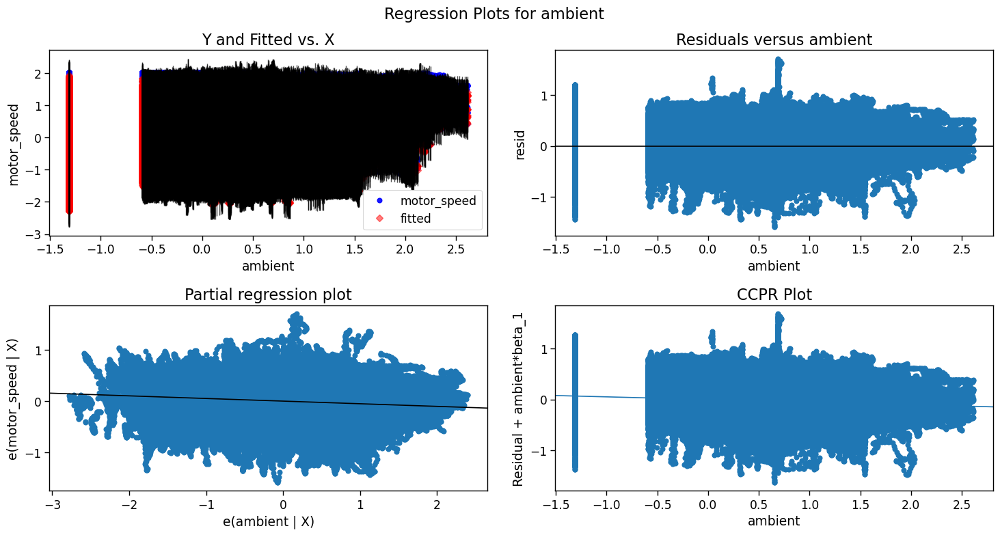

In [40]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "ambient", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


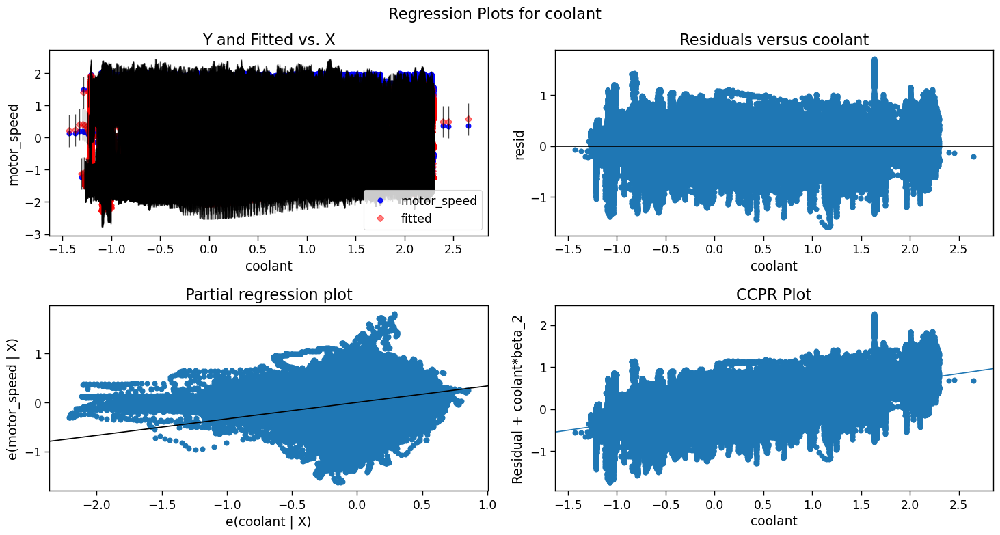

In [41]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "coolant", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


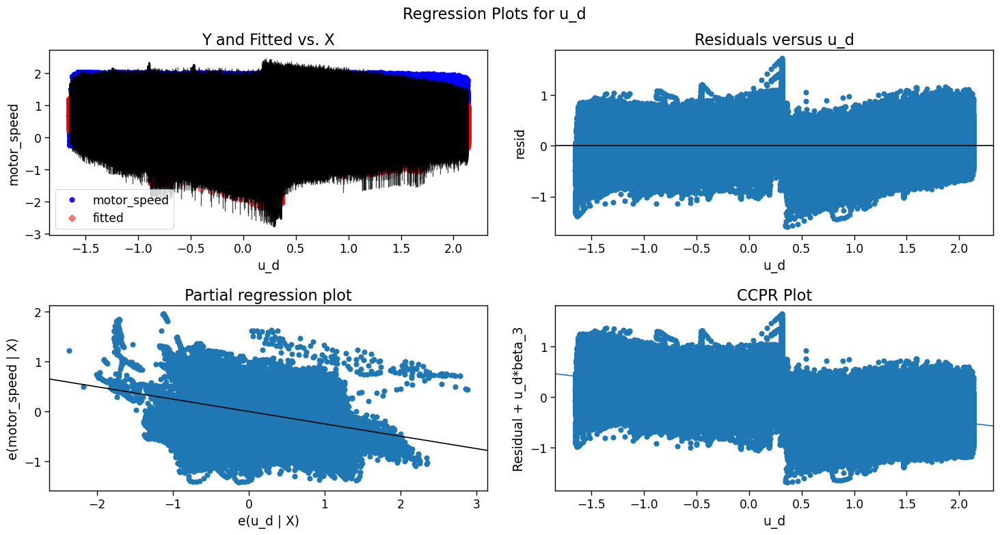

In [42]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "u_d", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


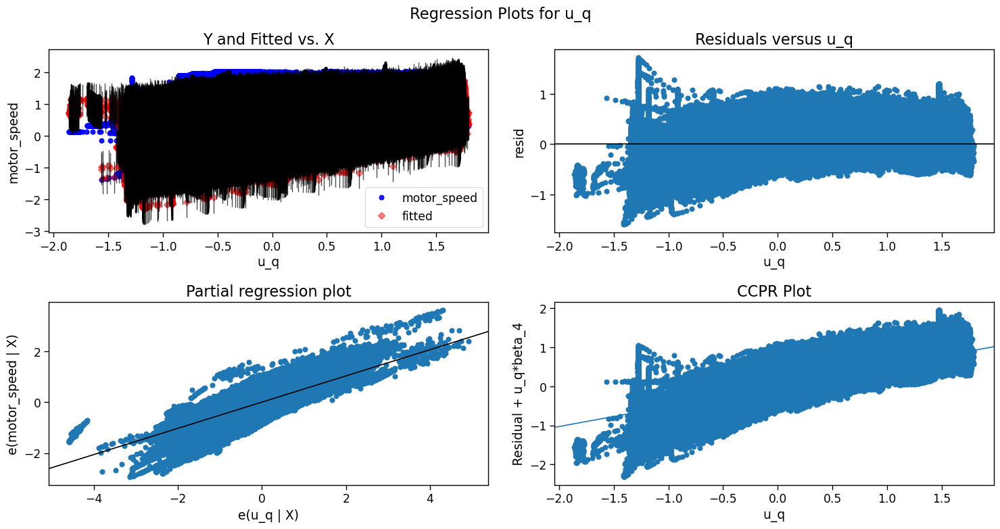

In [43]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "u_q", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


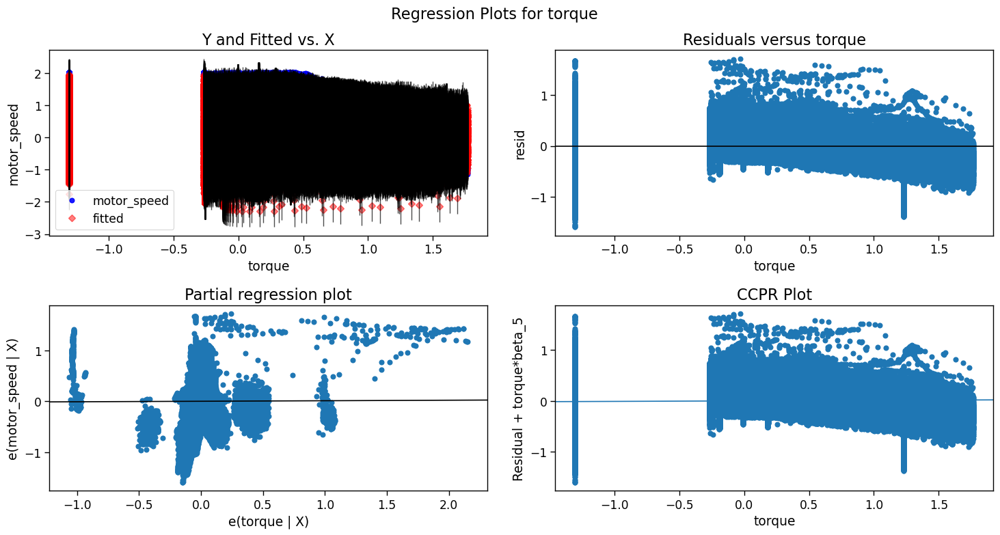

In [44]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "torque", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


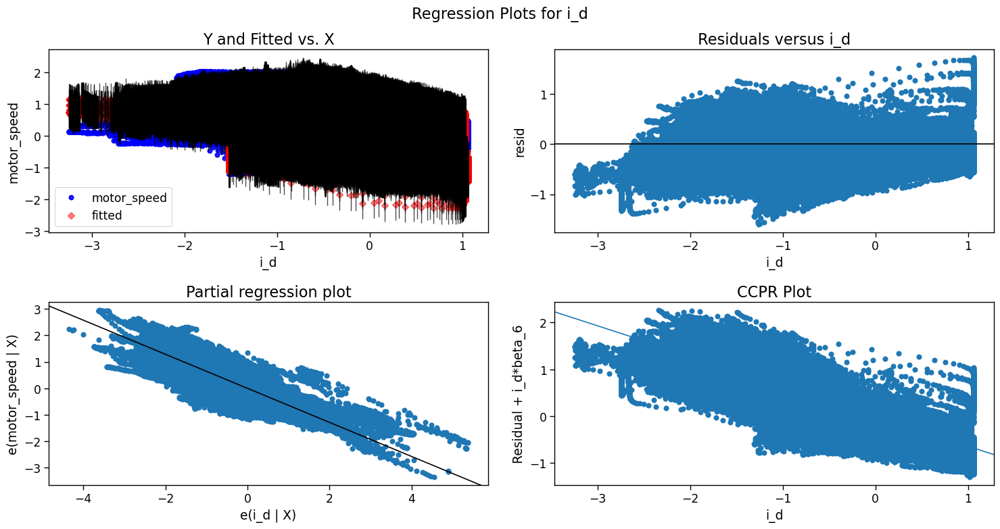

In [45]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "i_d", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


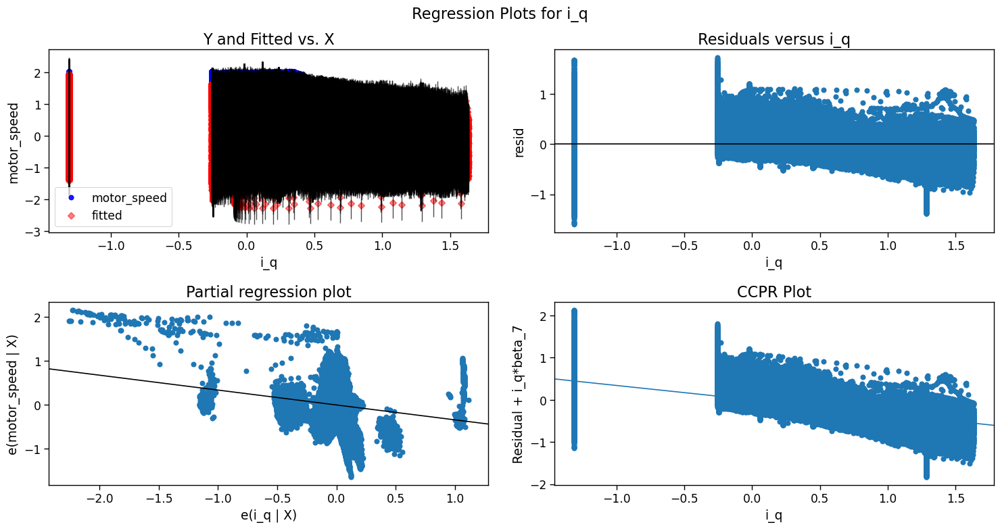

In [46]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "i_q", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


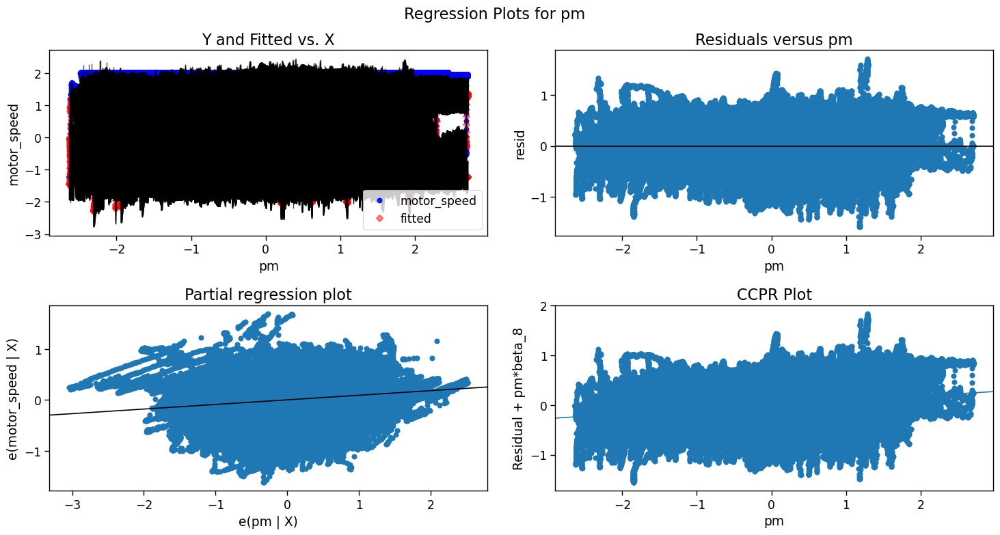

In [47]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "pm", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


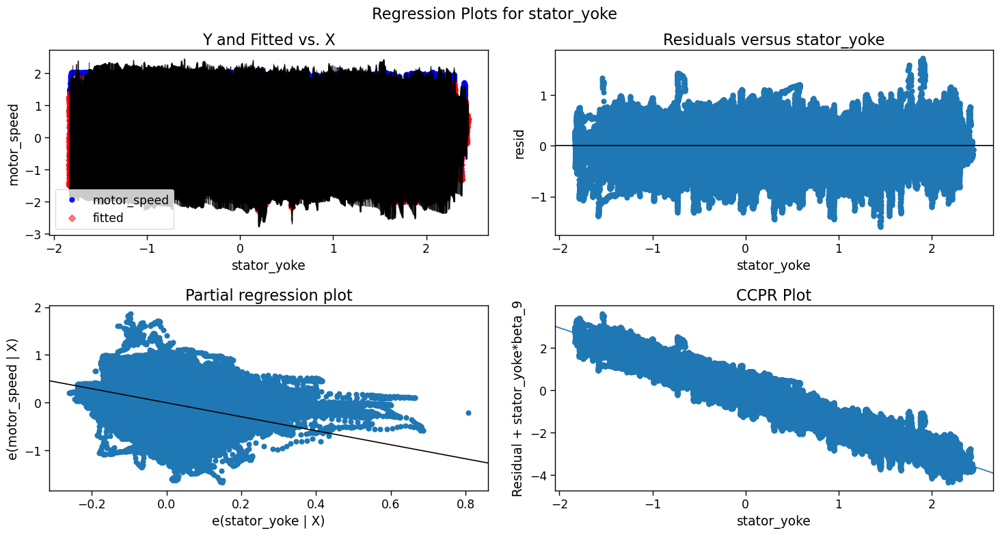

In [48]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "stator_yoke", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


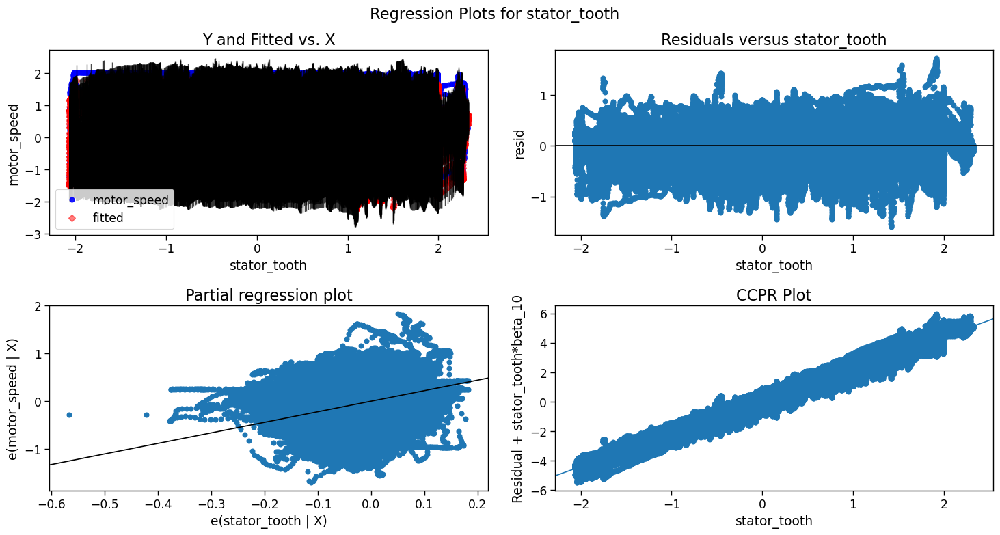

In [49]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "stator_tooth", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

eval_env: 1


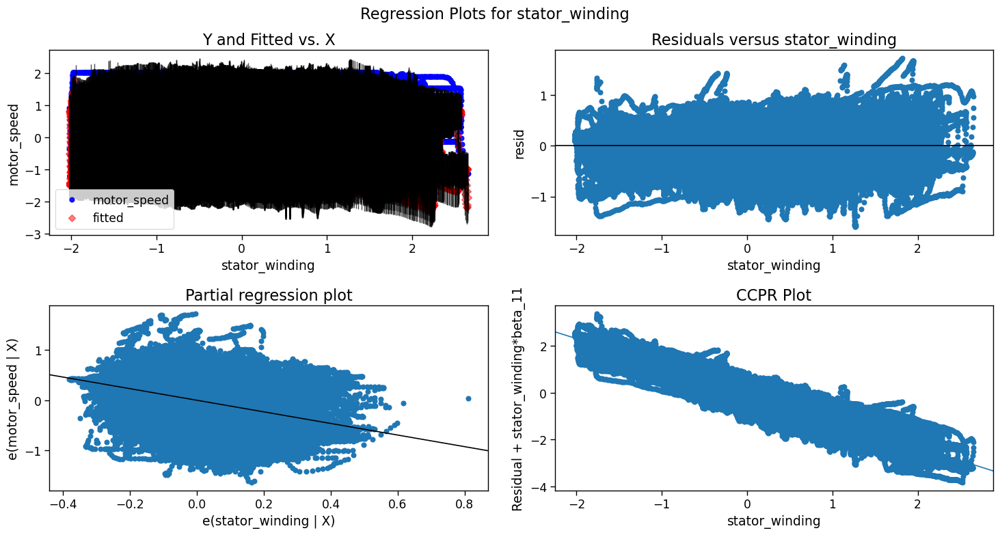

In [50]:
import statsmodels.api as sm
fig = plt.figure(figsize=(15,8))
fig = sm.graphics.plot_regress_exog(model, "stator_winding", fig=fig)
plt.show()

#partial regression plot : if we get a slent line then adding this feature to the model will cause
#changes in the model. if we get a straight line then it means adding this feature will not change
#the model.

In [51]:
#for torque there is a straight line for partial regression plot 
#it means adding this feature will not affect the model
#also correlation between torque and i_q is 99%
#with this information we conclude that we can drop torque

#### d) improving model

In [52]:
import statsmodels.formula.api as sms
model1 = sms.ols('motor_speed~ambient+coolant+u_d+u_q+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit()     
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:            motor_speed   R-squared:                       0.936
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                 1.459e+06
Date:                Mon, 30 Jan 2023   Prob (F-statistic):               0.00
Time:                        19:32:10   Log-Likelihood:                -45740.
No. Observations:              998070   AIC:                         9.150e+04
Df Residuals:                  998059   BIC:                         9.163e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.0254      0.000    -98.

In [53]:
#rsquared remain same 
#AIC remain same
#all p-values are significant

### 8. dealing with problematic rows

#### a) checking influential points

showing first highly influential point


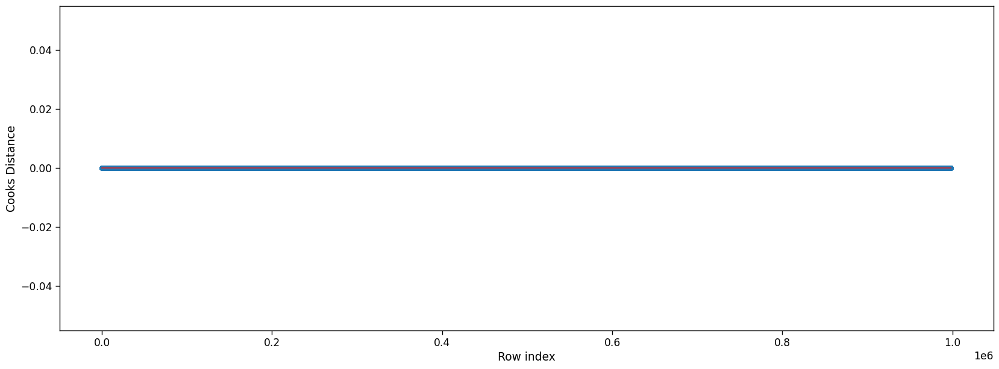

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         998070 non-null  float64
 1   coolant         998070 non-null  float64
 2   u_d             998070 non-null  float64
 3   u_q             998070 non-null  float64
 4   motor_speed     998070 non-null  float64
 5   torque          998070 non-null  float64
 6   i_d             998070 non-null  float64
 7   i_q             998070 non-null  float64
 8   pm              998070 non-null  float64
 9   stator_yoke     998070 non-null  float64
 10  stator_tooth    998070 non-null  float64
 11  stator_winding  998070 non-null  float64
 12  profile_id      998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-1.30969,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-1.30969,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-1.30969,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-1.30969,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-1.30969,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [54]:
import statsmodels.formula.api as smf 
model_outlier = smf.ols('motor_speed~ambient+coolant+u_d+u_q+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit()

model_influence = model_outlier.get_influence()
(c , _) = model_influence.cooks_distance

print("showing first highly influential point")
fig = plt.subplots(figsize=(20, 7))
plt.stem(np.arange(len(data)), np.round(c, 3))
plt.xlabel('Row index')
plt.ylabel('Cooks Distance')
plt.show()

#loop for droping the first influential point and detecting and droping rest of influential points
while np.max(c)>1 :
    print("point having cook's distance > 1 is : ")
    print(np.argmax(c), np.max(c))
    data=data.drop(data.index[[np.argmax(c)]],axis=0).reset_index(drop=True)
   
    model_oulier = smf.ols('motor_speed~ambient+coolant+u_d+u_q+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding',data=data).fit()
    model_influence = model_outlier.get_influence()
    (c , _) = model_influence.cooks_distance
    if np.max(c) < 1:
        print(np.argmax(c), np.max(c),"it is not a influential point") 
        print("now all the influential points are droped out")
        break      
    
data.info()
data.head()

In [55]:
#there is no influential point in our data

In [56]:
#so model1 is our final model

### 9. Final model

In [57]:
x = data
y = data['motor_speed']

In [58]:
x=x.drop('motor_speed',axis=1)
x=x.drop('torque',axis=1)
x=x.drop('profile_id',axis=1)

In [59]:
x.head()

,ambient,coolant,u_d,u_q,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-1.30969,-1.118446,0.327935,-1.297858,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-1.30969,-1.117021,0.329665,-1.297686,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-1.30969,-1.116681,0.332771,-1.301822,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-1.30969,-1.116764,0.333700,-1.301852,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-1.30969,-1.116775,0.335206,-1.303118,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145


In [60]:
y.head()

0   -1.222428
1   -1.222429
2   -1.222428
3   -1.222430
4   -1.222429
Name: motor_speed, dtype: float64

#### a) building model

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.30,random_state=7)
model = LinearRegression()
model.fit(X_train, Y_train)
result1 = model.score(X_train, Y_train)
result2 = model.score(X_test, Y_test)
print(result1)
print(result2)

0.9360366812171759
0.9358711442778481


#### b) predicting the target variable

In [62]:
pred = model.predict(x)
predicted_motor_speed = pd.Series(data = pred,name='predicted_motor_speed')

data1=pd.concat([data,predicted_motor_speed],axis=1)
print(data1.head())

   ambient   coolant       u_d       u_q  motor_speed    torque       i_d  \
0 -1.30969 -1.118446  0.327935 -1.297858    -1.222428 -0.250182  1.029572   
1 -1.30969 -1.117021  0.329665 -1.297686    -1.222429 -0.249133  1.029509   
2 -1.30969 -1.116681  0.332771 -1.301822    -1.222428 -0.249431  1.029448   
3 -1.30969 -1.116764  0.333700 -1.301852    -1.222430 -0.248636  1.032845   
4 -1.30969 -1.116775  0.335206 -1.303118    -1.222429 -0.248701  1.031807   

        i_q        pm  stator_yoke  stator_tooth  stator_winding  profile_id  \
0 -0.245860 -2.522071    -1.831422     -2.066143       -2.018033           4   
1 -0.245832 -2.522418    -1.830969     -2.064859       -2.017631           4   
2 -0.245818 -2.522673    -1.830400     -2.064073       -2.017343           4   
3 -0.246955 -2.521639    -1.830333     -2.063137       -2.017632           4   
4 -0.246610 -2.521900    -1.830498     -2.062795       -2.018145           4   

   predicted_motor_speed  
0              -1.439202  
1 

In [64]:
data=data.drop(['profile_id'],axis=1)

In [65]:
data

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding
0,-1.309690,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033
1,-1.309690,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631
2,-1.309690,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343
3,-1.309690,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632
4,-1.309690,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145
...,...,...,...,...,...,...,...,...,...,...,...,...
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.255640,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.255640,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.255640,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.255640,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581


In [67]:
from sklearn.preprocessing import StandardScaler
import scipy.stats as st
from sklearn import model_selection
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn import tree
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, KFold, cross_val_score, RandomizedSearchCV
from sklearn import metrics
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [74]:
X = data[["ambient","pm","stator_yoke","coolant","stator_tooth","stator_winding","i_q","u_d","u_q","i_d"]]
Y = data['motor_speed']

In [75]:
#Splitting Data

In [76]:
from sklearn.model_selection import train_test_split

In [77]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.25,random_state=1)

In [78]:
#Scaling the features
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()

# fit and transform
X_train = sc_X.fit_transform(X_train)
X_test  = sc_X.transform(X_test)

# 1) Multiple Linear Regression

In [84]:
model1 = LinearRegression()
model1.fit(X_train, Y_train)
result1 = (model1.score(X_train, Y_train)*100)
result2 = (model1.score(X_test, Y_test)*100)
print("Training Accuracy is: ",result1)
print()
print("Testing Accuracy is: ",result2)
print()
y_pred1 = model1.predict(X_test)
mse = metrics.mean_squared_error(Y_test, y_pred1)
mae = metrics.mean_absolute_error(Y_test, y_pred1)
r2_score = metrics.r2_score(Y_test, y_pred1)
rmse = np.sqrt(mse)
print('Mean Squared Error: ',mse)
print()
print('Mean Absolute Error: ',mae)
print()
print('Root Mean Squared Error: ',rmse)
print()
print('r2_score: ',r2_score)

Training Accuracy is:  93.60495218166255

Testing Accuracy is:  93.57987917822264

Mean Squared Error:  0.06438353957943672

Mean Absolute Error:  0.1922716787036467

Root Mean Squared Error:  0.25373911716453323

r2_score:  0.9357987917822264


# 2) KNN

In [85]:
model2 = KNeighborsRegressor(n_neighbors=10,p=2,metric='minkowski')
model2.fit(X_train, Y_train)
result1 = (model2.score(X_train, Y_train)*100)
result2 = (model2.score(X_test, Y_test)*100)
print("Training Accuracy is: ",result1)
print()
print("Testing Accuracy is: ",result2)
print()
y_pred2 = model2.predict(X_test)
mse = metrics.mean_squared_error(Y_test, y_pred2)
mae = metrics.mean_absolute_error(Y_test, y_pred2)
r2_score = metrics.r2_score(Y_test, y_pred2)
rmse = np.sqrt(mse)
print('Mean Squared Error: ',mse)
print()
print('Mean Absolute Error: ',mae)
print()
print('Root Mean Squared Error: ',rmse)
print()
print('r2_score: ',r2_score)

Training Accuracy is:  99.85762600562036

Testing Accuracy is:  99.81443171237014

Mean Squared Error:  0.001860953013653473

Mean Absolute Error:  0.01768560077663135

Root Mean Squared Error:  0.04313876462827225

r2_score:  0.9981443171237013


# 3)Decision Tree 

In [86]:
model3 = DecisionTreeRegressor()
model3.fit(X_train,Y_train)
result1 = (model3.score(X_train,Y_train)*100)
result2 = (model3.score(X_test,Y_test)*100)
print("Training Accuracy is: ",result1)
print()
print("Testing Accuracy is: ",result2)
print()
y_pred3 = model3.predict(X_test)
mse = metrics.mean_squared_error(Y_test, y_pred3)
mae = metrics.mean_absolute_error(Y_test, y_pred3)
r2_score = metrics.r2_score(Y_test, y_pred3)
rmse = np.sqrt(mse)
print('Mean Squared Error: ',mse)
print()
print('Mean Absolute Error: ',mae)
print()
print('Root Mean Squared Error: ',rmse)
print()
print('r2_score: ',r2_score)

Training Accuracy is:  99.99999999981154

Testing Accuracy is:  99.94940604142704

Mean Squared Error:  0.000507376453604072

Mean Absolute Error:  0.007617114222351869

Root Mean Squared Error:  0.02252501839297966

r2_score:  0.9994940604142704


# 4)XGBoost Regressor

In [87]:
from xgboost import XGBRegressor
model4 = XGBRegressor()
model4.fit(X_train,Y_train)
result1 = (model4.score(X_train,Y_train)*100)
result2 = (model4.score(X_test,Y_test)*100)
print("Training Accuracy is: ",result1)
print()
print("Testing Accuracy is: ",result2)
print()
y_pred4 = model4.predict(X_test)
mse = metrics.mean_squared_error(Y_test, y_pred4)
mae = metrics.mean_absolute_error(Y_test, y_pred4)
r2_score = metrics.r2_score(Y_test, y_pred4)
rmse = np.sqrt(mse)
print('Mean Squared Error: ',mse)
print()
print('Mean Absolute Error: ',mae)
print()
print('Root Mean Squared Error: ',rmse)
print()
print('r2_score: ',r2_score)

Training Accuracy is:  99.93603512474469

Testing Accuracy is:  99.92650315477155

Mean Squared Error:  0.0007370557618913194

Mean Absolute Error:  0.013461782856709258

Root Mean Squared Error:  0.02714877090940434

r2_score:  0.9992650315477155


# 5) Adaboost Regressor 

In [89]:
from sklearn.ensemble import AdaBoostRegressor
dtree = DecisionTreeRegressor()
model5 = AdaBoostRegressor()
model5.fit(X_train, Y_train)
result1 = (model5.score(X_train,Y_train)*100)
result2 = (model5.score(X_test,Y_test)*100)
print("Training Accuracy is: ",result1)
print()
print("Testing Accuracy is: ",result2)
print()
y_pred5 = model5.predict(X_test)
mse = metrics.mean_squared_error(Y_test, y_pred5)
mae = metrics.mean_absolute_error(Y_test, y_pred5)
r2_score = metrics.r2_score(Y_test, y_pred5)
rmse = np.sqrt(mse)
print('Mean Squared Error: ',mse)
print()
print('Mean Absolute Error: ',mae)
print()
print('Root Mean Squared Error: ',rmse)
print()
print('r2_score: ',r2_score)

Training Accuracy is:  91.48863423948181

Testing Accuracy is:  91.50379380396923

Mean Squared Error:  0.08520335412406863

Mean Absolute Error:  0.25893709140537174

Root Mean Squared Error:  0.29189613584984064

r2_score:  0.9150379380396922


# 6) Random Forest

In [97]:
from sklearn.ensemble import RandomForestRegressor
model6 = RandomForestRegressor()
model6.fit(X_train, Y_train)
result1 = model6.score(X_train,Y_train)
result2 = model6.score(X_test,Y_test)
print("Training Accuracy is: ",result1)
print()
print("Testing Accuracy is: ",result2)
print()
y_pred6 = model6.predict(X_test)
mse = metrics.mean_squared_error(Y_test, y_pred6)
mae = metrics.mean_absolute_error(Y_test, y_pred6)
r2_score = metrics.r2_score(Y_test, y_pred6)
rmse = np.sqrt(mse)
print('Mean Squared Error: ',mse)
print()
print('Mean Absolute Error: ',mae)
print()
print('Root Mean Squared Error: ',rmse)
print()
print('r2_score: ',r2_score)

Training Accuracy is:  0.9999689380571473

Testing Accuracy is:  0.9997844534095939

Mean Squared Error:  0.00021615874248893043

Mean Absolute Error:  0.004389188078169774

Root Mean Squared Error:  0.014702337993969885

r2_score:  0.9997844534095939


# Comparison of Models

model1: 0.919374 (0.025571)
model2: 0.958230 (0.013550)
model3: 0.990101 (0.013357)
model4: 0.993797 (0.007014)
model5: 0.903266 (0.013541)
model6: 0.994301 (0.007555)


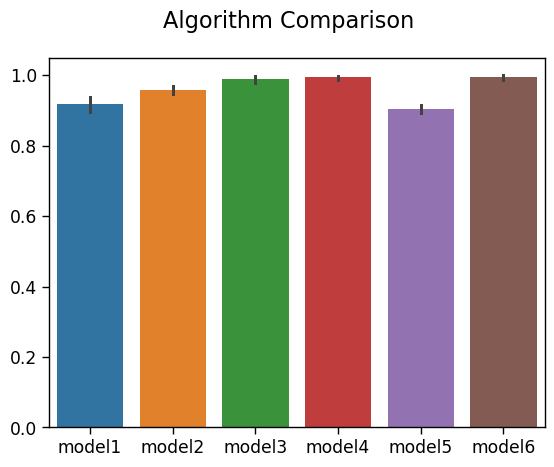

In [111]:
# prepare models
models = []
models.append(('model1', LinearRegression()))
models.append(('model2', KNeighborsRegressor()))
models.append(('model3', DecisionTreeRegressor()))
models.append(('model4',XGBRegressor()))
models.append(('model5',AdaBoostRegressor()))
models.append(('model6',RandomForestRegressor()))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
    cv_results = model_selection.cross_val_score(model, X, Y)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)
# barplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
sns.barplot(results)
ax.set_xticklabels(names)
plt.show()

# Model Saving

In [153]:
import pickle

In [159]:
pickle.dump(model6,open('model_pickle','wb'))

In [160]:
model_loaded = pickle.load(open('model_pickle','rb'))

In [161]:
model_loaded.predict(X_test)

array([-1.2224306 , -0.41079211,  0.05177244, ...,  0.60354693,
       -0.43785253, -0.54606301])